**Step 1: Load yass**

In [1]:
%load_ext line_profiler
%load_ext memory_profiler

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import util
import models

from os.path import expanduser
from os import path

import matplotlib.pyplot as plt
%matplotlib inline

import yass
from yass import read_config
from yass.augment import make_training_data, save_detect_network_params, save_triage_network_params, save_ae_network_params, train_detector, train_ae, train_triage

Using TensorFlow backend.


**Step 2: Read Configuration File**

In [4]:
yass.set_config("../config/49-lab.yaml")
CONFIG = read_config()

**Step 3: Load Spike Train**

To train the Neural Network, you need to have a recording with sorted result. The result does not need to be perfect.
If you don't have any sorting result yet, you can run yass with threshold detection option. In your configuration file, set spikes.detection = threshold.

spike_train is a matrix of size (number of spikes x 2). Each row represents an individual spike. The first column is the spike time (not in milliseconds or seconds but in actual temporal location in recording). The second column is the spike ID.

In [5]:
import numpy as np
# load ground truth
# make spikeTrain
import scipy.io
#kk = scipy.io.loadmat('/ssd/data/peter/ej49_dataset/groundtruth_ej49_data2_set1.mat')
#kk = scipy.io.loadmat('/media/cat/1TB/liam/49channels/groundtruth_ej49_data1_set1.mat')

#L_gt has length total number of spikes; it is the cluster index for each spike
#spt_gt has length total number of spikes; it is the time for each spike
#L_gt = kk['L_gt']-1
#spt_gt = kk['spt_gt'] +5
#spike_train = np.concatenate((spt_gt, L_gt),axis=1)

fname = '/home/Edu/data/nnet/spike_train.npy'

spike_train = np.load(fname)
n_templates = np.max(spike_train[:,1])+1

print("# templates: ", n_templates)

# templates:  42


**Step 4: Make Training Dataset**

1. CONFIG and spike_train are from step 2 and 3.

2. chosen_templates: It is a vector containing which templates to use. Given spike sorting result, not all templates look good. Therefore, the training dataset should be obtained from good looking templates only. Make sure that you do not include bad templates. However, it is still important to keep variability in template shapes. To visually check templates, check optional step at the bottom.

3. min_amp: the minimum of absolute maximal amplitude of augmented spikes. It should determine how small spikes in the training set can be. Default is 3.

4. nspikes: approximately how many training data it should produce?

In [6]:
min_amp = 5
nspikes = 50000

#chosen_templates = [0, 1, 2, 3, 4, 5, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48] # should be your own number
#chosen_templates = [0,1,2,3,4,5,6,8,9,12,13,14,16,17,18,19,21,22,23,24,27,28,29,31,32,34,35,37,38,39,40,41,46]
chosen_templates = np.arange(n_templates)

del_templates = [21,23,27,35,39, 68, 73, 80, 94, 99, 103, 104, 106, 117, 124, 128]
chosen_templates = np.delete(chosen_templates, del_templates)

print(chosen_templates)

data_folder = '/home/Edu/data/nnet/'

templates = np.load(data_folder + 'templates/templates.npy')
print(templates.shape)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 24 25
 26 28 29 30 31 32 33 34 36 37 38 40 41]
(49, 41, 42)


/home/Edu/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.
  if __name__ == '__main__':


In [7]:
(x_detect, y_detect,
 x_triage, y_triage,
 x_ae,
 y_ae) = make_training_data(CONFIG,
                            spike_train,
                            chosen_templates,
                            min_amp,
                            nspikes,
                            '/home/Edu/data/nnet/')

100%|██████████| 113/113 [00:06<00:00, 17.37it/s]


In [8]:
# %mprun -f make_training_data make_training_data(CONFIG, spike_train, chosen_templates, min_amp, nspikes, '/home/Edu/data/nnet/', multi=False)

In [8]:
from sklearn.decomposition import PCA

In [9]:
pca = PCA(n_components=3)
pca = pca.fit(x_ae)

In [10]:
pca.components_.T.shape

(21, 3)

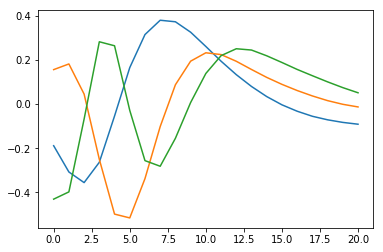

In [11]:
plt.plot(pca.components_.T)

In [12]:
pca = PCA(n_components=3)
z = pca.fit_transform(x_ae)
x_back = pca.inverse_transform(z)

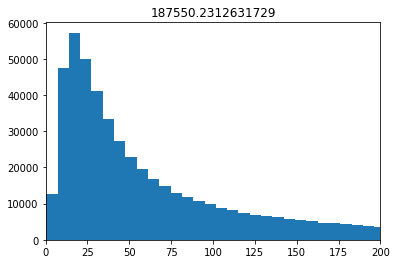

In [13]:
plt.hist(np.sum(np.square(x_back - y_ae), 1), 1000)
plt.xlim([0, 200])
plt.title(np.var(np.sum(np.square(x_back - y_ae), 1)))
plt.show()

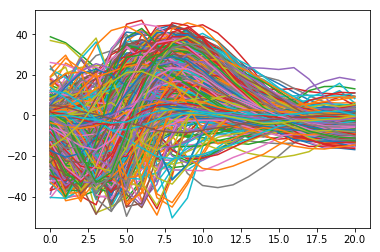

In [14]:
idx = np.random.choice(x_ae.shape[0], 1000)
plt.plot(x_ae[idx].T)
plt.show()

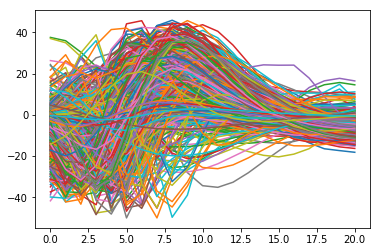

In [15]:
plt.plot(y_ae[idx].T)
plt.show()

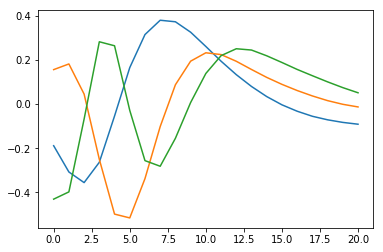

In [16]:
plt.plot(pca.components_.T)

In [17]:
from yass.neuralnetwork.nnae import AutoEncoder
nnae = AutoEncoder(CONFIG.detect.neural_network_autoencoder.filename)
rot = nnae.load_rotation()

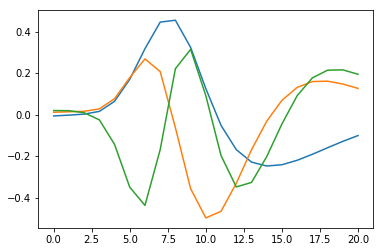

In [18]:
plt.plot(rot)

In [19]:
x_back2 = np.matmul(np.matmul(x_ae, rot), rot.T)

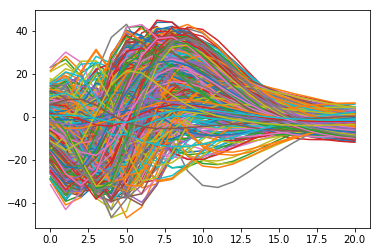

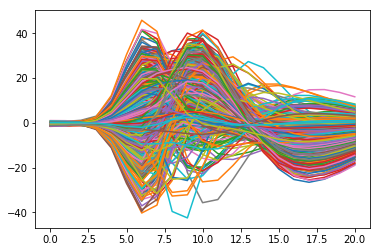

In [20]:
plt.plot(x_back[idx].T)
plt.show()
plt.plot(x_back2[idx].T)
plt.show()

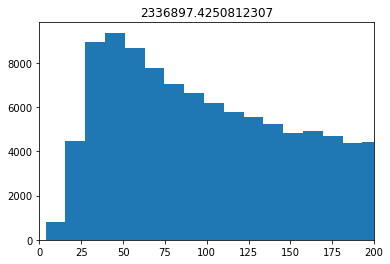

In [21]:
plt.hist(np.sum(np.square(x_back2 - y_ae), 1), 1000)
plt.xlim([0, 200])
plt.title(np.var(np.sum(np.square(x_back2 - y_ae), 1)))
plt.show()

**Step 5: Train All Three Neural Networks**

Training parameters:
1. n_iter: the number of iterations to run
2. n_batch: the size of mini-batch to be used for training
3. l2_reg_scale: L2 regularization penalty term
4. train_step_size: training step size

In [8]:
n_iter = 5000
n_batch = 512
l2_reg_scale = 0.00000005
train_step_size =  0.001

Training neural net detector
1. detectnet_name: name of saved model with the location to save 
2. n_filters: number of filters to use in each layer. It should be a list of length 2

In [9]:
detectnet_name = path.join('models', 'detect-'+util.directory())
n_filters_detect = [8, 4]

In [12]:
# run training
train_detector(x_detect, y_detect, n_filters_detect, n_iter, n_batch, l2_reg_scale, train_step_size, detectnet_name)

12502500it [01:32, 134548.15it/s]                   

Approximate training true positive rate: 1.0, false positive rate: 0.0


In [13]:
# save model parameters
save_detect_network_params(filters = n_filters_detect,
                           size = x_detect.shape[1],
                           n_neighbors = x_detect.shape[2],
                           output_path = detectnet_name.replace('ckpt', 'yaml'))

Training neural net triage
1. triagenet_name: name of saved model with the location to save 
2. n_filters: number of filters to use in each layer. It should be a list of length 2

## Keras

In [52]:
import keras

n_samples, window_size, n_channels = x_detect.shape

if K.image_data_format() == 'channels_first':
    _x_detect = x_detect.reshape(n_samples, 1, window_size, n_channels)
    input_shape = (1, window_size, n_channels)
else:
    _x_detect = x_detect.reshape(n_samples, window_size, n_channels, 1)
    input_shape = (window_size, n_channels, 1)

_y_detect = keras.utils.to_categorical(y_detect, num_classes=2)

In [53]:
print(y_detect.shape)
print(_x_detect.shape)
print(input_shape)

(650143,)
(650143, 21, 7, 1)
(21, 7, 1)


In [54]:
batch_size = 512
epochs = 5

model = models.default_model(_x_detect, input_shape, K1=8, K2=4)

In [56]:
model.fit(_x_detect, _y_detect,
          batch_size=batch_size, epochs=epochs, shuffle=False,
          validation_data=(_x_detect, _y_detect))

ValueError: Error when checking target: expected conv2d_33 to have 4 dimensions, but got array with shape (650143, 2)

In [14]:
triagenet_name = path.join('models', 'triage-'+util.directory())
n_filters_triage = [8, 4]

In [15]:
# run training
train_triage(x_triage, y_triage, n_filters_triage, n_iter, n_batch, l2_reg_scale, train_step_size, triagenet_name)

12502500it [00:28, 443893.36it/s]                  

Approximate training true positive rate: 0.9302325581395349, false positive rate: 0.11176470588235295


In [28]:
# save model parameters
save_triage_network_params(filters = n_filters_triage,
                           size = x_detect.shape[1],
                           n_neighbors = x_detect.shape[2],
                           output_path = triagenet_name.replace('ckpt', 'yaml'))

Training autoencoder
1. ae_name: name of saved model with the location to save 
2. n_feature: number of latent variables

In [29]:
ae_name = path.join('models', 'autoencoder-'+util.directory())
n_features = 3
n_batch = 1024
n_iter = 10000
train_step_size =  0.0001

In [30]:
# run training
train_ae(x_ae, y_ae, n_features, n_iter, n_batch, train_step_size, ae_name)

50005000it [02:04, 766053.00it/s]                     


In [32]:
# save model parameters
save_ae_network_params(n_input = x_ae.shape[1],
                       n_features = n_features,
                       output_path = ae_name.replace('ckpt', 'yaml'))

**You are done!**

**Step 6: When Using yass**

Make sure that you have all your files! You must have **3 '.ckpt'** files and **1 '.yaml'** file for **each neural network model**, which make **total 12 files**.

Also, make sure that the parameters in your configuration file match with the parameters used during the training

| Name in config.yaml | How it should change |
|---|---|
|spikes.temporal_features|n_feature used for training autoencoder|
|recordings.spike_size_ms|make sure that this value stays the same as configuration loaded here|
|neural_network_detector.filename|file name used above to save neural net detector|
|neural_network_triage.filename|file name used above to save neural net triage|
|neural_network_autoencoder.filename|file name used above to save neural net autoencoder|

**Step 3.2: Visually Inspect Templates (optional)**

In [12]:
import os
%matplotlib inline
import matplotlib.pyplot as plt
from yass.templates.util import get_templates
#from yass.augment.process import process_data

In [27]:
# process data to get standardized recording
#process_data(CONFIG)

# prameters
path = os.path.join(CONFIG.data.root_folder,  'tmp/standarized.bin')
dtype = 'float64'

#templates, _ = get_templates(np.hstack((spike_train, np.ones((spike_train.shape[0], 1), 'int32'))),
#                             path, 1000000, 4*CONFIG.spike_size)

templates = np.load('/media/cat/1TB/liam/49channels/data1_set1/yass/tmp/templates.npy')
print templates.shape

(49, 41, 132)


In [23]:
from yass.augment.choose import choose_templates
from yass.augment.crop import crop_templates

In [28]:
templates = np.transpose(templates, (2, 1, 0))
print templates.shape
#templates = choose_templates(templates, chosen_templates)
#templates_uncropped = np.copy(templates)

(132, 41, 49)


In [25]:
#templates = crop_templates(templates, CONFIG.spike_size,
#                           CONFIG.neigh_channels, CONFIG.geom)

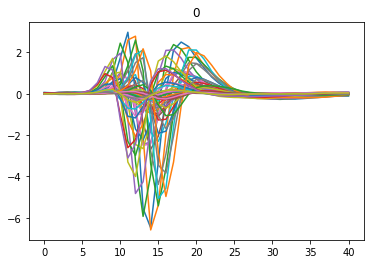

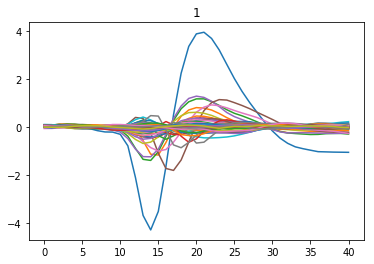

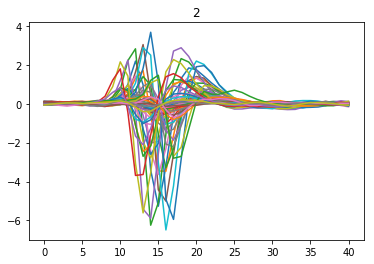

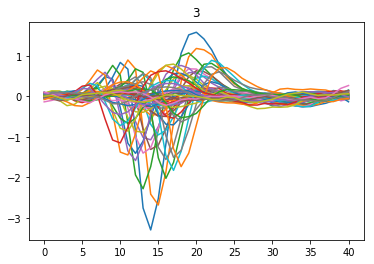

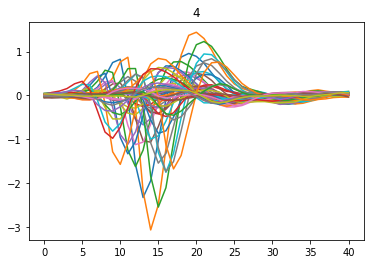

...

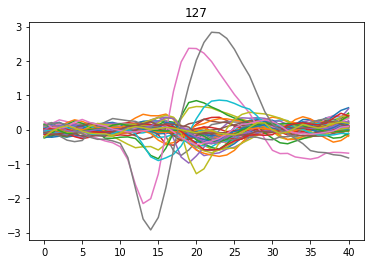

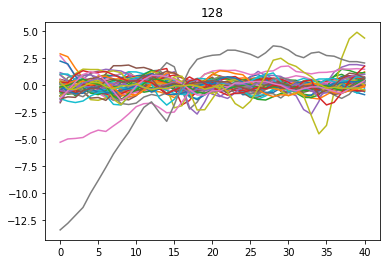

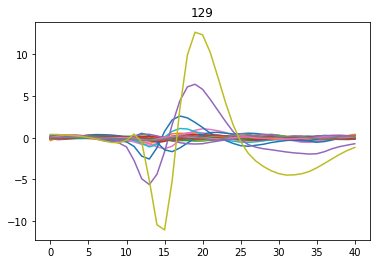

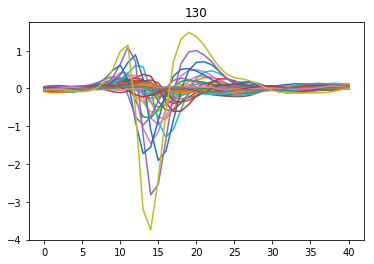

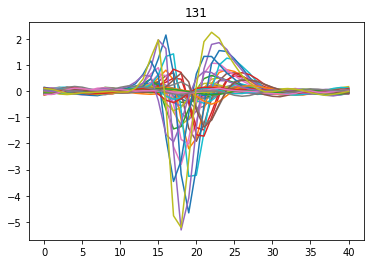

In [29]:
for k in range(templates.shape[0]):
    plt.plot(templates[k])
    plt.title(str(k))
    plt.show()

In [132]:
n_channels = templates_uncropped.shape[2]
templates_ae = crop_templates(templates_uncropped, CONFIG.spike_size,
                              np.ones((n_channels, n_channels), 'int32'),
                              CONFIG.geom)

tt = templates_ae.transpose(1, 0, 2).reshape(templates_ae.shape[1], -1)
tt = tt[:, np.ptp(tt, axis=0) > 2]

In [135]:
tt.shape

(61, 213)

In [ ]:

y_ae = np.zeros((nk*tt.shape[1], tt.shape[0]))
for k in range(tt.shape[1]):
    amp_now = np.max(np.abs(tt[:, k]))
    amps_range = (np.arange(nk)*(max_amp-min_amp)
                  / nk+min_amp)[:, np.newaxis, np.newaxis]
    y_ae[k*nk:(k+1)*nk] = (tt[:, k]/amp_now)[np.newaxis, :]*amps_range[:, :, 0]
    
noise = np.random.normal(size=y_ae.shape)
noise = np.matmul(noise, temporal_SIG)

x_ae = y_ae + noise
x_ae = x_ae[:, (mid_point-R):(mid_point+R+1)]
y_ae = y_ae[:, (mid_point-R):(mid_point+R+1)]


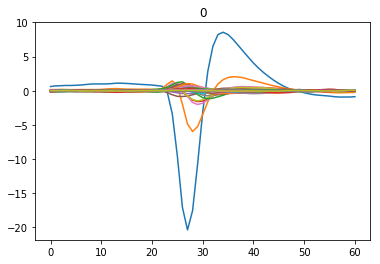

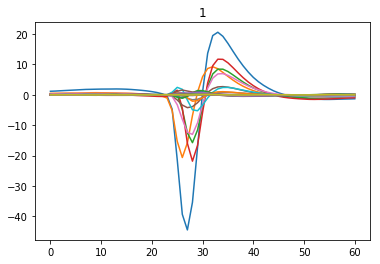

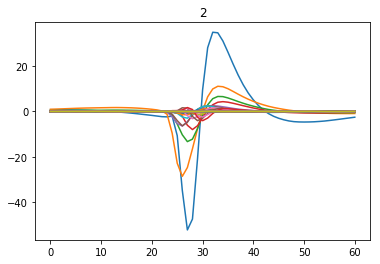

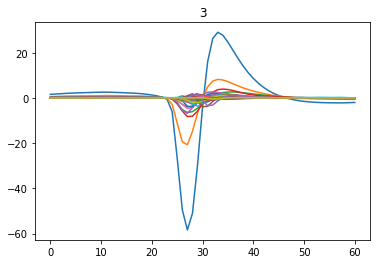

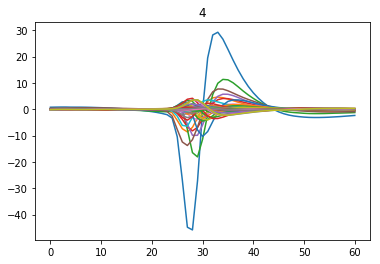

...

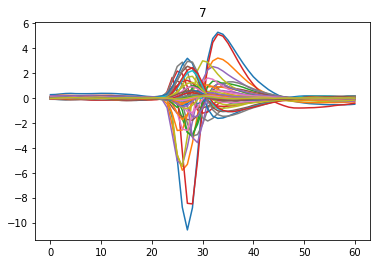

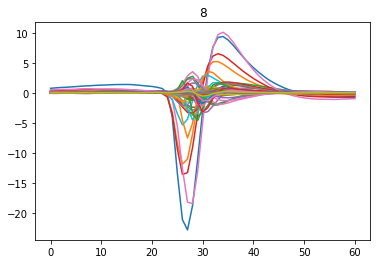

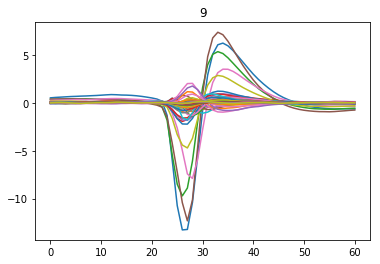

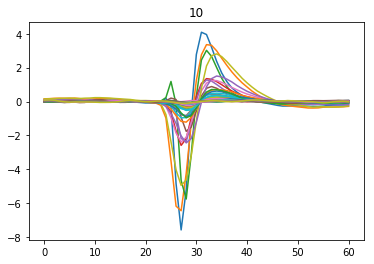

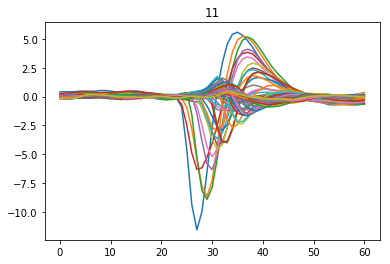

In [96]:
for k in range(templates_ae.shape[0]):
    plt.plot(templates_ae[k])
    plt.title(str(k))
    plt.show()

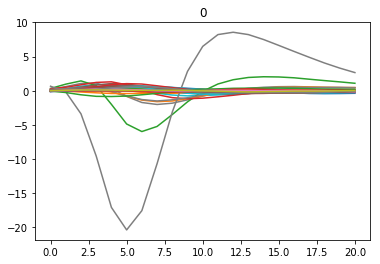

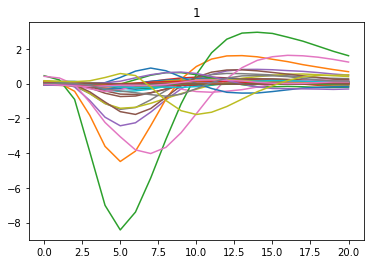

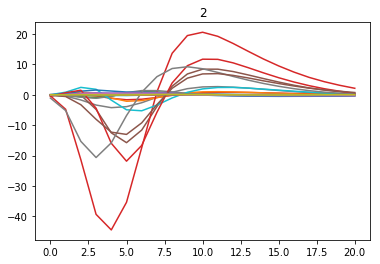

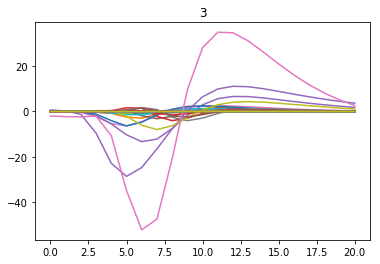

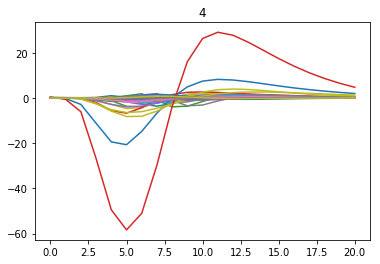

...

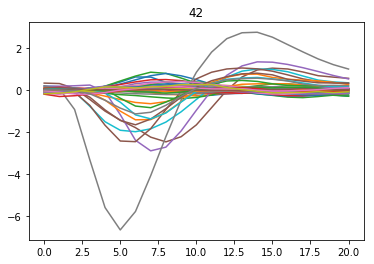

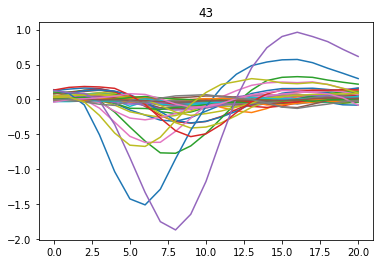

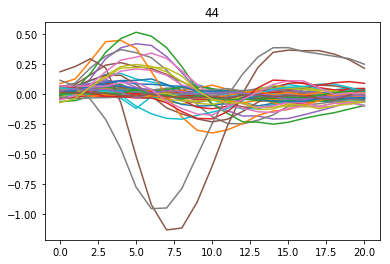

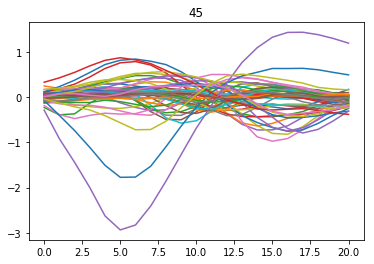

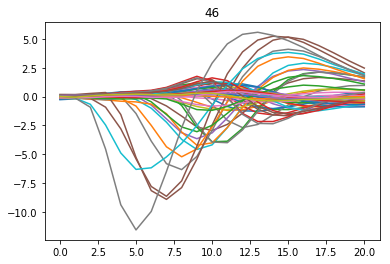

In [70]:
for k in range(templates.shape[2]):
    plt.plot(templates[:,:,k].T)
    plt.title(str(k))
    plt.show()

In [44]:
templates = np.transpose(templates, (2, 1, 0))
tt = templates[chosen_templates].transpose(1, 0, 2).reshape(templates.shape[1], -1)
tt = tt[:, np.ptp(tt, axis=0) > 2]

In [45]:
tt.shape

(21, 120)

In [38]:
templates.shape

(47, 21, 49)

In [40]:
tt.shape

(21, 735)

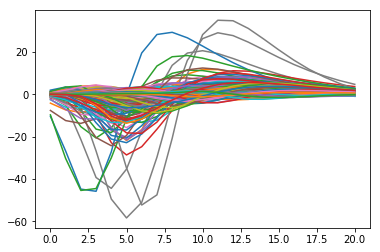

In [42]:
plt.plot(tt2)
plt.show()

In [30]:
tt2.shape

(21, 234)

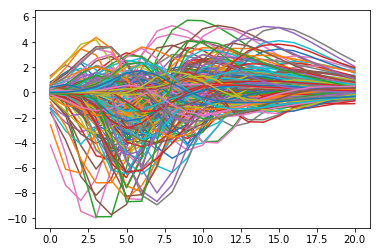

In [36]:
plt.plot(tt2[:, np.min(tt2, 0) > - 10])
plt.show()